# Full Cataract Segmentation & Postprocessing Pipeline

This notebook combines automatic prompting, segmentation, and postprocessing into a single end-to-end pipeline.

Sections:
1. Automatic Prompting & Segmentation (SAM2 based)
2. Postprocessing & Incision Geometry Extraction

## 1. Automatic Prompting & Segmentation

Before running the cells below, connect to a tpu runtime.



In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip uninstall -y opencv-python opencv-contrib-python
!pip install opencv-contrib-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 MB 55.7 MB/s eta 0:00:00


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
from google.colab.patches import cv2_imshow
from collections import deque

In [ ]:
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

!mkdir -p ./checkpoints/
!wget -P ./checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt

PyTorch version: 2.9.0+cpu
Torchvision version: 0.24.0+cpu
CUDA is available: False
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.9/72.9 MB 60.0 MB/s eta 0:00:00
  Cloning https://github.com/facebookresearch/sam2.git to /tmp/pip-req-build-ja5cw_zc
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/sam2.git /tmp/pip-req-build-ja5cw_zc
  Resolved https://github.com/facebookresearch/sam2.git to commit 2b90b9f5ceec907a1c18123530e92e794ad901a4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 9.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... do

In [ ]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=400):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_points(coords, ax, marker_size=400, color = "green"):
    ax.scatter(coords[:, 0], coords[:, 1], color=color, marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

In [ ]:
def find_optic_disk_circles_structured(image):
    """Detect two concentric circles (inner & outer optic disk) whose centers lie
    within `center_thresh` pixels of each other, and which have the largest radius gap."""

    lab    = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l2    = clahe.apply(l)
    lab2   = cv2.merge((l2,a,b))
    enhanced = cv2.cvtColor(lab2, cv2.COLOR_LAB2RGB).astype(np.float32)
    denoised = cv2.fastNlMeansDenoisingColored((enhanced).astype(np.uint8), None, 10,10,7,21)
    denoised = denoised.astype(np.float32) / 255.0

    edge_detector = cv2.ximgproc.createStructuredEdgeDetection('/content/drive/MyDrive/Cataract/models/model.yml')
    # detect the edges
    edges = edge_detector.detectEdges(denoised) * 255.0

    kernel    = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    closed    = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=1)
    closed = cv2.convertScaleAbs(closed)

    raw = cv2.HoughCircles(
        closed,
        cv2.HOUGH_GRADIENT,
        dp=1.2,
        minDist=0.1,
        param1=100,
        param2=40,
        minRadius=60,
        maxRadius=100
    )
    if raw is None:
        return None, None
    circles = np.round(raw[0]).astype(int)

    h, w = image.shape[:2]
    img_c = np.array([w//2, h//2])

    def dist2_center(c):
        return (c[0]-img_c[0])**2 + (c[1]-img_c[1])**2

    candidates = sorted(circles, key=dist2_center)[:64]

    valid_pairs = []
    for i in range(len(candidates)):
        for j in range(i+1, len(candidates)):
            c1, c2 = candidates[i], candidates[j]
            center_dist = np.hypot(c1[0]-c2[0], c1[1]-c2[1])
            radius_diff = abs(c1[2] - c2[2])
            inner_r = min(c1[2], c2[2])
            if center_dist < inner_r*0.1 and radius_diff < inner_r *0.6 and radius_diff > inner_r *0.2:
                valid_pairs.append((center_dist-radius_diff, c1, c2))

    if valid_pairs:
        _, c1, c2 = min(valid_pairs, key=lambda x: x[0])
        inner, outer = sorted((c1, c2), key=lambda c: c[2])
    else:
        print("fallback")
        sorted_by_r = sorted(candidates, key=lambda c: c[2])
        inner, outer = sorted_by_r[0], sorted_by_r[-1]

    return inner, outer

def sample_ring_points(inner, outer, center, num_points=3):
    cx, cy = center
    r_out = (inner[2] + outer[2]) / 2.0
    r_in = 2 * inner[2] - outer[2]
    angles = np.linspace(0, 2*np.pi, num_points, endpoint=False)
    outer_pts = []
    inner_pts = []
    for a in angles:
        x_o = int(cx + r_out * np.cos(a))
        y_o = int(cy + r_out * np.sin(a))
        x_i = int(cx + r_in * np.cos(a))
        y_i = int(cy + r_in * np.sin(a))
        outer_pts.append([x_o,y_o])
        inner_pts.append([x_i,y_i])

    return outer_pts, inner_pts

In [ ]:
class RingDetector:
    def __init__(self, N=5):
        self.N = N
        self.buf = deque(maxlen=N)

    def add_frame(self, frame):
        self.buf.append(frame)

    def get_average(self):
        arr = np.stack(self.buf, axis=0).astype(np.float32)
        avg = np.mean(arr, axis=0)
        return avg.astype(np.uint8)

    def detect_on_average(self):
        if len(self.buf) < self.N:
            print(f"not enough frames ({len(self.buf)} < {self.N})")
            return None, None
        avg_frame = self.get_average()

        inner, outer = find_optic_disk_circles_structured(avg_frame)
        return inner, outer

SAM prompt points: [[346, 188], [221, 260], [221, 115]] [[303, 188], [243, 222], [242, 153]]


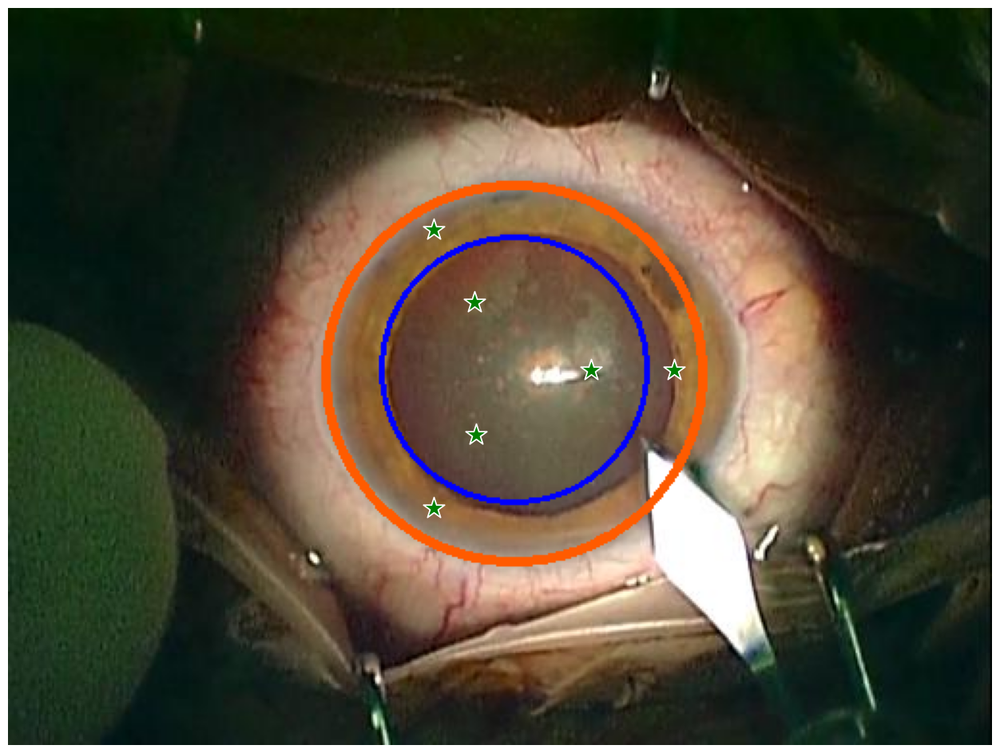

In [ ]:
det = RingDetector(N=2)
start = 150
for j in range(det.N):
    frame = cv2.imread(f"/content/drive/MyDrive/Cataract/frames/case_2023_50fps/0{start+j}.jpeg")
    if frame is None:
      print(f"Failed to read /content/drive/MyDrive/Cataract/frames/case_2023_50fps/0{start+j}.jpeg, skipping")
      continue
    det.add_frame(frame)
inner, outer = det.detect_on_average()
if inner is None:
  print(f"no circles found")

center = (inner[0], inner[1])
outer_pts, inner_pts = sample_ring_points(inner, outer, center, num_points=3)
print("SAM prompt points:", outer_pts, inner_pts)

plt.figure(figsize=(16, 12))
ax = plt.subplot(1, 1, 1)
ax.axis("off")

final_circle_img = cv2.imread(f"/content/drive/MyDrive/Cataract/frames/case_2023_50fps/0{start}.jpeg")

if inner is not None:
  cv2.circle(final_circle_img, (inner[0], inner[1]), inner[2], (255, 0, 0), 2)
  cv2.circle(final_circle_img, (outer[0], outer[1]), outer[2], (0, 91, 255), 3)

final_circle_img_rgb = cv2.cvtColor(final_circle_img, cv2.COLOR_BGR2RGB)
#save circle image
cv2.imwrite(f"/content/drive/MyDrive/Cataract/figures/circle.png", final_circle_img)

show_points(np.array(outer_pts), ax, color='green')
show_points(np.array(inner_pts), ax, color='green')
ax.imshow(final_circle_img_rgb)
#save whole figure
plt.savefig(f"/content/drive/MyDrive/Cataract/figures/circle_prompt.png", bbox_inches='tight')

The following cell is only for visualizing the output of the automatic prompting method for all cases in the frames/ folder. You don't need to run it for the segmentation.

SAM prompt points: [[349, 195], [226, 266], [225, 123]] [[301, 195], [250, 224], [250, 165]]
case_5303_50fps frame 1 - 1
SAM prompt points: [[358, 158], [236, 228], [236, 87]] [[304, 158], [263, 181], [263, 134]]
case_2007_50fps frame 1 - 1
SAM prompt points: [[350, 200], [222, 274], [222, 125]] [[310, 200], [242, 238], [242, 161]]
case_2023_50fps frame 1 - 1
SAM prompt points: [[346, 196], [233, 260], [233, 131]] [[304, 196], [254, 224], [254, 167]]
case_2040_50fps frame 1 - 1
SAM prompt points: [[343, 218], [228, 284], [228, 151]] [[297, 218], [252, 243], [252, 192]]
case_2005_50fps frame 1 - 1
SAM prompt points: [[313, 205], [196, 272], [195, 137]] [[280, 205], [212, 243], [212, 166]]
case_5325_50fps frame 1 - 1
SAM prompt points: [[342, 209], [228, 274], [227, 143]] [[300, 209], [249, 238], [249, 179]]
case_5305_50fps frame 1 - 1
SAM prompt points: [[345, 187], [222, 258], [221, 115]] [[294, 187], [247, 213], [247, 160]]
case_2001_50fps frame 1 - 1
SAM prompt points: [[342, 207], [

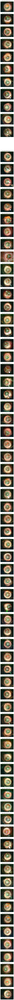

In [ ]:
video_dir = "/content/drive/MyDrive/Cataract/frames/"
case_names = list(os.listdir("/content/drive/MyDrive/Cataract/frames"))
frame_names = [
    p for p in os.listdir(os.path.join(video_dir, case_names[0]))
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

plt.figure(figsize=(4, len(case_names)*3))

for i in range(len(case_names)):

    det = RingDetector(N=1)
    for j in range(det.N):
        frame = cv2.imread(os.path.join(video_dir, case_names[i], frame_names[j]))
        if frame is None:
          print(f"Failed to read {os.path.join(video_dir, case_names[i], frame_names[j])}, skipping")
          continue
        det.add_frame(frame)
    inner, outer = det.detect_on_average()
    if inner is None:
      print(f"no circles found in {case_names[i]}")
      continue
    center = (inner[0], inner[1])
    outer_pts, inner_pts = sample_ring_points(inner, outer, center, num_points=3)
    print("SAM prompt points:", outer_pts, inner_pts)

    print(f"{case_names[i]} frame {1} - {det.N}")
    ax = plt.subplot(len(case_names), 1, i + 1)
    ax.axis("off")
    ax.set_title(f"{case_names[i]} frame {1} - {det.N}", fontsize=10)

    final_circle_img = cv2.imread(os.path.join(video_dir, case_names[i], frame_names[0]))
    if final_circle_img is None:
      print(f"Error loading image: {os.path.join(video_dir, case_names[i], frame_names[0])}")
      continue

    if inner is not None:
      cv2.circle(final_circle_img, (inner[0], inner[1]), inner[2], (0, 255, 0), 2)
      cv2.circle(final_circle_img, (outer[0], outer[1]), outer[2], (0, 0, 255), 3)

    final_circle_img_rgb = cv2.cvtColor(final_circle_img, cv2.COLOR_BGR2RGB)

    show_points(np.array(outer_pts), ax)
    show_points(np.array(inner_pts), ax)
    ax.imshow(final_circle_img_rgb)

In [ ]:
def segment_with_sam2(sam_predictor, inference_state, video_dir, ann_frame_idx = 0):
  prompts = {}
  det = RingDetector(N=2)
  for j in range(det.N):
      frame = cv2.imread(os.path.join(video_dir, frame_names[ann_frame_idx+j]))
      if frame is None:
        print(f"Failed to read {os.path.join(video_dir, frame_names[ann_frame_idx+j])}, skipping")
        continue
      det.add_frame(frame)
  inner, outer = det.detect_on_average()
  if inner is None:
    raise RuntimeError("no circles found – try a different ann_frame_idx ")
  else:
    center = (inner[0], inner[1])
    od_points, p_points = sample_ring_points(inner, outer, center, num_points=3)
    ann_obj_id = 1
    points = np.array(od_points, dtype=np.float32)
    labels = np.array([1, 1, 1], np.int32)
    prompts[ann_obj_id] = points, labels
    sam_predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=ann_frame_idx,
        obj_id=ann_obj_id,
        points=points,
        labels=labels,
    )
    ann_obj_id = 2
    points = np.array(p_points, dtype=np.float32)
    labels = np.array([1, 1, 1], np.int32)
    prompts[ann_obj_id] = points, labels
    sam_predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=ann_frame_idx,
        obj_id=ann_obj_id,
        points=points,
        labels=labels,
    )

In [ ]:
def propagate_in_video(sam_predictor, inference_state, ann_frame_idx, num_frames = 500):
  video_segments = {}
  for out_frame_idx, out_obj_ids, out_mask_logits in sam_predictor.propagate_in_video(inference_state):
      video_segments[out_frame_idx] = {
          out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
          for i, out_obj_id in enumerate(out_obj_ids)
      }
      if out_frame_idx >= ann_frame_idx + num_frames:
          break
  return video_segments

In [ ]:
def segment_by_case(case_name, inference_state, sam_predictor, ann_frame_idx=0, num_frames = 500):
  video_dir = f"/content/drive/MyDrive/Cataract/frames/{case_name}"
  segment_with_sam2(sam_predictor, inference_state, video_dir, ann_frame_idx)
  video_segments = propagate_in_video(sam_predictor, inference_state, ann_frame_idx)
  vis_frame_stride = 1
  for out_frame_idx in range(ann_frame_idx, ann_frame_idx+num_frames, vis_frame_stride):
      od_mask_logits = video_segments[out_frame_idx][1]
      p_mask_logits = video_segments[out_frame_idx][2]
      od_contours, _ = cv2.findContours((od_mask_logits[0] > 0.0).astype(np.uint8) * 255, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
      p_contours, _ = cv2.findContours((p_mask_logits[0] > 0.0).astype(np.uint8) * 255, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
      od_contour=max(od_contours, key=len)
      p_contour=max(p_contours, key=len)
      epsilon = 0.005 * cv2.arcLength(od_contour, True)
      approx = cv2.approxPolyDP(od_contour, epsilon, True)
      od_mask_color = cv2.cvtColor(np.zeros_like((od_mask_logits[0] > 0.0).astype(np.uint8) * 255), cv2.COLOR_GRAY2BGR)
      cv2.drawContours(od_mask_color, [approx], -1, (255, 255, 255), cv2.FILLED)
      od_mask = cv2.cvtColor(od_mask_color, cv2.COLOR_BGR2GRAY)
      od_mask_convex = np.zeros_like(od_mask)
      cv2.fillConvexPoly(od_mask_convex, cv2.convexHull(approx), 255)
      k_mask = od_mask_convex - od_mask
      p_mask = np.zeros_like((p_mask_logits[0] > 0.0).astype(np.uint8) * 255)
      cv2.fillConvexPoly(p_mask, cv2.convexHull(p_contour), 255)
      i_mask = np.logical_and(np.logical_not(p_mask), k_mask) * 255
      dir = f'/content/drive/MyDrive/Cataract/seg_results/{case_name}'
      if not os.path.exists(dir):
        os.makedirs(dir)
        os.makedirs(dir+'/intersection')
        os.makedirs(dir+'/pupil')
        os.makedirs(dir+'/optic_disk')
        os.makedirs(dir+'/knife')
      cv2.imwrite(f'{dir}/pupil/{str(out_frame_idx+1).zfill(4)}.jpeg', p_mask)
      cv2.imwrite(f'{dir}/intersection/{str(out_frame_idx+1).zfill(4)}.jpeg', i_mask)
      cv2.imwrite(f'{dir}/optic_disk/{str(out_frame_idx+1).zfill(4)}.jpeg', od_mask_convex)
      cv2.imwrite(f'{dir}/knife/{str(out_frame_idx+1).zfill(4)}.jpeg', k_mask)

In [ ]:
case_names = list(os.listdir("/content/drive/MyDrive/Cataract/frames"))
frame_names = [
    p for p in os.listdir(os.path.join("/content/drive/MyDrive/Cataract/frames", case_names[0]))
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

In [ ]:
case_names.sort(key=lambda p: int(p.split('_')[1]))

In [ ]:
# load base images and masks
img = cv2.imread("/content/drive/MyDrive/Cataract/frames/case_2023_50fps/0150.jpeg", cv2.IMREAD_COLOR_RGB)
od_mask = cv2.imread("/content/drive/MyDrive/Cataract/seg_results/case_2023_50fps/optic_disk/0150.jpeg", cv2.IMREAD_GRAYSCALE)
p_mask = cv2.imread("/content/drive/MyDrive/Cataract/seg_results/case_2023_50fps/pupil/0150.jpeg", cv2.IMREAD_GRAYSCALE)
i_mask = cv2.imread("/content/drive/MyDrive/Cataract/seg_results/case_2023_50fps/intersection/0150.jpeg", cv2.IMREAD_GRAYSCALE)
k_mask = cv2.imread("/content/drive/MyDrive/Cataract/seg_results/case_2023_50fps/knife/0150.jpeg", cv2.IMREAD_GRAYSCALE)

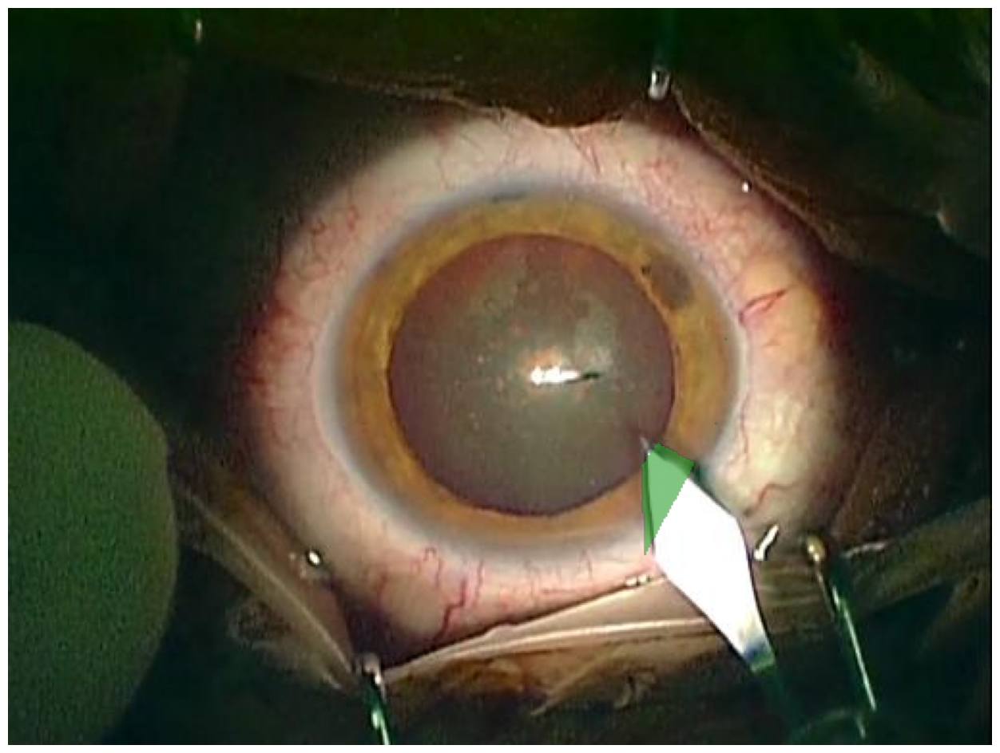

In [ ]:
#make figures and save
plt.figure(figsize=(16, 12))
ax = plt.subplot(1, 1, 1)
ax.axis("off")
ax.imshow(img)
#show_mask((od_mask-i_mask)/255, ax, obj_id=1)
#show_mask((p_mask-i_mask)/255, ax, obj_id=0)
show_mask((i_mask)/255, ax, obj_id=2)
plt.savefig("/content/drive/MyDrive/Cataract/figures/intersection_mask.png")

In [ ]:
from sam2.build_sam import build_sam2_video_predictor
sam2_checkpoint = "./checkpoints/sam2.1_hiera_small.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_s.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device='cpu')
#start_idx = [200, 500, 500, 650, 500, 480, 470, 470, 450, 450, 300, 600, 450, 1, 400, 250, 300, 400, 650, 250, 450, 550, 500, 700, 600, 400, 425, 450, 450, 300]
for case_name in case_names_4:
  start_idx = 0
  print(f"Processing {case_name}")
  print(f"Starting at frame {start_idx}")
  inference_state = predictor.init_state(video_path=f"/content/drive/MyDrive/Cataract/frames/{case_name}")
  segment_by_case(case_name, inference_state, predictor, ann_frame_idx=start_idx)

Processing case_5072_50fps
Starting at frame 0


frame loading (JPEG): 100%|██████████| 500/500 [00:16<00:00, 29.87it/s]
/usr/local/lib/python3.12/dist-packages/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/usr/local/lib/python3.12/dist-packages/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 500/500 [12:13<00:00,  1.47s/it]


Processing case_5104_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:16<00:00,  1.47s/it]


Processing case_5180_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:07<00:00,  1.46s/it]


Processing case_5299_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:18<00:00,  1.48s/it]


Processing case_5300_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:52<00:00,  1.54s/it]


Processing case_5301_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:17<00:00,  1.47s/it]


Processing case_5303_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:41<00:00,  1.52s/it]


Processing case_5304_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:50<00:00,  1.54s/it]


Processing case_5305_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:39<00:00,  1.52s/it]


Processing case_5309_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:13<00:00,  1.47s/it]


Processing case_5315_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:23<00:00,  1.49s/it]


Processing case_5316_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:51<00:00,  1.54s/it]


Processing case_5317_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:51<00:00,  1.54s/it]


Processing case_5319_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:22<00:00,  1.48s/it]


Processing case_5325_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:53<00:00,  1.55s/it]


Processing case_5329_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:56<00:00,  1.55s/it]


Processing case_5334_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:43<00:00,  1.53s/it]


Processing case_5335_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:48<00:00,  1.54s/it]


Processing case_5340_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:31<00:00,  1.50s/it]


Processing case_5353_50fps
Starting at frame 0


propagate in video: 100%|██████████| 500/500 [12:22<00:00,  1.49s/it]


## 2. Postprocessing & Incision Geometry Extraction

In [ ]:
from __future__ import annotations
from dataclasses import dataclass
from typing import Dict, Optional, Tuple, List, Any
import math
import numpy as np
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
from google.colab.patches import cv2_imshow
from collections import deque

In [ ]:
@dataclass
class IncisionParams:
    """
    Tunables to adapt to your data (units are pixels or degrees).
    """
    open_kernel: int = 3
    close_kernel: int = 7
    blur_sigma: float = 0.8
    min_area: int = 150
    min_area_triangle: int = 150
    keep_top_k: int = 5
    approx_eps_frac: float = 0.03
    parallel_tol_deg: float = 12.0
    perpendicular_tol_deg: float = 18.0
    trapezoid_min_aspect: float = 0.25
    require_trapezoid: bool = False

In [ ]:
def _angle_deg(v: np.ndarray) -> float:
    ang = math.degrees(math.atan2(float(v[1]), float(v[0])))
    return abs(ang) % 180.0

def _ang_diff_deg(a: float, b: float) -> float:
    d = abs(a - b) % 180.0
    return min(d, 180.0 - d)

def _edge_angles_and_lengths(quad: np.ndarray) -> Tuple[List[float], List[float], List[np.ndarray]]:
    vecs, angs, lens = [], [], []
    for i in range(4):
        j = (i + 1) % 4
        v = quad[j] - quad[i]
        vecs.append(v)
        angs.append(_angle_deg(v))
        lens.append(float(np.linalg.norm(v)))
    return angs, lens, vecs

In [ ]:
class IncisionDetector:
    def __init__(self, params: Optional[IncisionParams] = None) -> None:
        self.P = params or IncisionParams()
    def process_frame(self, mask: np.ndarray) -> Dict[str, Any]:
        m = self._preprocess_mask(mask)
        cnts, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = sorted(cnts, key=cv2.contourArea, reverse=True)[: self.P.keep_top_k]
        best_score = None
        best_quad = None
        debug = {"tested": 0, "rejected_reason": []}
        for c in cnts:
            debug["tested"] += 1
            quad = self._contour_to_quad(c)
            if quad is None:
                debug["rejected_reason"].append("not-quad")
                continue
            trap_ok, _ = self._is_trapezoid(quad)
            if self.P.require_trapezoid and not trap_ok:
                debug["rejected_reason"].append("not-trapezoid")
                continue
            area = cv2.contourArea(quad.astype(np.int32))
            score = 0.001 * area
            if best_score is None or score > best_score:
                best_score, best_quad = score, quad.copy()
        return {
            "accepted": best_quad is not None,
            "quad": best_quad,
            "debug": debug,
            "mask_clean": m,
        }
    def _preprocess_mask(self, mask: np.ndarray) -> np.ndarray:
       P = self.P
       m = mask.astype(np.uint8)
       if m.max() <= 1:
           m = (m * 255).astype(np.uint8)
       if P.blur_sigma and P.blur_sigma > 0:
           m = cv2.GaussianBlur(m, (0, 0), P.blur_sigma, P.blur_sigma)
           _, m = cv2.threshold(m, 127, 255, cv2.THRESH_BINARY)
       if P.open_kernel and P.open_kernel > 1:
           k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (P.open_kernel, P.open_kernel))
           m = cv2.morphologyEx(m, cv2.MORPH_OPEN, k)
       if P.close_kernel and P.close_kernel > 1:
           k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (P.close_kernel, P.close_kernel))
           m = cv2.morphologyEx(m, cv2.MORPH_CLOSE, k)
       num, labels, stats, _ = cv2.connectedComponentsWithStats(m, connectivity=8)
       keep = np.zeros_like(m)
       comps = [(i, stats[i, cv2.CC_STAT_AREA]) for i in range(1, num)]
       comps.sort(key=lambda x: x[1], reverse=True)
       kept = 0
       for i, area in comps:
           if area >= P.min_area and kept < P.keep_top_k:
               keep[labels == i] = 255
               kept += 1
       return keep
    def _contour_to_quad(self, cnt: np.ndarray) -> Optional[np.ndarray]:
        P = self.P
        peri = cv2.arcLength(cnt, True)
        eps = P.approx_eps_frac * peri
        approx = cv2.approxPolyDP(cnt, eps, True)
        if len(approx) > 8:
            hull = cv2.convexHull(cnt)
            peri = cv2.arcLength(hull, True)
            eps = P.approx_eps_frac * peri
            approx = cv2.approxPolyDP(hull, eps, True)
        if len(approx) != 4:
            return None
        pts = approx.reshape(-1, 2).astype(np.float32)
        c = pts.mean(axis=0)
        order = np.argsort(np.arctan2(pts[:, 1] - c[1], pts[:, 0] - c[0]))
        return pts[order]
    def _is_trapezoid(self, quad: np.ndarray) -> Tuple[bool, Optional[Tuple[int, int]]]:
        P = self.P
        angs, lens, _ = _edge_angles_and_lengths(quad)
        for a, b in [(0, 2), (1, 3)]:
            if _ang_diff_deg(angs[a], angs[b]) <= P.parallel_tol_deg:
                short_over_long = min(lens[a], lens[b]) / max(lens[a], lens[b] if max(lens[a], lens[b]) > 0 else 1.0)
                if short_over_long >= P.trapezoid_min_aspect:
                    return True, (a, b)
        return False, None
    def _perpendicular_side_ratio(self, quad: np.ndarray, iris_center: Tuple[float, float], knife_point: Tuple[float, float],) -> Optional[float]:
        P = self.P
        cx, cy = iris_center
        kx, ky = knife_point
        ref_vec = np.array([kx - cx, ky - cy], dtype=np.float32)
        if np.allclose(ref_vec, 0):
            return None
        ref_ang = _angle_deg(ref_vec)
        angs, lens, _ = _edge_angles_and_lengths(quad)
        perp_idxs = []
        for i, ang in enumerate(angs):
            if abs(_ang_diff_deg(ang, ref_ang) - 90.0) <= P.perpendicular_tol_deg:
                perp_idxs.append(i)
        if len(perp_idxs) != 2:
            return None
        L1, L2 = lens[perp_idxs[0]], lens[perp_idxs[1]]
        if min(L1, L2) == 0:
            return None
        return max(L1, L2) / min(L1, L2)

In [ ]:
from __future__ import annotations

from dataclasses import dataclass
from typing import Any, Dict, List, Optional, Tuple

import math
import numpy as np
import cv2


def _angle_deg(v: np.ndarray) -> float:
    ang = math.degrees(math.atan2(float(v[1]), float(v[0])))
    return abs(ang) % 180.0


def _ang_diff_deg(a: float, b: float) -> float:
    d = abs(a - b) % 180.0
    return min(d, 180.0 - d)


def _edge_angles_and_lengths(
    poly: np.ndarray,
) -> Tuple[List[float], List[float], List[np.ndarray]]:
    """
    Works for any N-vertex polygon (N>=3). Returns edge angles/lengths/vectors.
    """
    n = poly.shape[0]
    vecs, angs, lens = [], [], []
    for i in range(n):
        j = (i + 1) % n
        v = poly[j] - poly[i]
        vecs.append(v)
        angs.append(_angle_deg(v))
        lens.append(float(np.linalg.norm(v)))
    return angs, lens, vecs


# --- assume IncisionParams exists as in your code ---


class IncisionDetector:
    def __init__(self, params: Optional["IncisionParams"] = None) -> None:
        self.P = params or IncisionParams()

    def process_frame(self, mask: np.ndarray) -> Tuple[Dict[str, Any], Dict[str, Any]]:
        """
        Returns (best_quad_dict, best_triangle_dict).

        Each dict has:
          - accepted: bool
          - poly: np.ndarray (Nx2) or None   (N=4 for quad, N=3 for triangle)
          - score: float or None
          - debug: dict
          - mask_clean: np.ndarray (uint8 0/255)
        """
        m = self._preprocess_mask(mask)

        cnts, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = sorted(cnts, key=cv2.contourArea, reverse=True)[: self.P.keep_top_k]

        best_quad_score: Optional[float] = None
        best_quad: Optional[np.ndarray] = None
        quad_debug = {"tested": 0, "rejected_reason": []}

        best_tri_score: Optional[float] = None
        best_tri: Optional[np.ndarray] = None
        tri_debug = {"tested": 0, "rejected_reason": []}

        for c in cnts:
            # ---- QUAD branch ----
            quad_debug["tested"] += 1
            quad = self._contour_to_quad(c)
            if quad is None:
                quad_debug["rejected_reason"].append("not-quad")
            else:
                trap_ok, _ = self._is_trapezoid(quad)
                if self.P.require_trapezoid and not trap_ok:
                    quad_debug["rejected_reason"].append("not-trapezoid")
                else:
                    score = self._quad_score(quad)
                    if best_quad_score is None or score > best_quad_score:
                        best_quad_score, best_quad = score, quad.copy()

            # ---- TRIANGLE branch ----
            tri_debug["tested"] += 1
            tri = self._contour_to_triangle(c)
            if tri is None:
                tri_debug["rejected_reason"].append("not-triangle")
            else:
                score = self._triangle_score(tri)
                if best_tri_score is None or score > best_tri_score:
                    best_tri_score, best_tri = score, tri.copy()

        best_quad_result = {
            "accepted": best_quad is not None,
            "poly": best_quad,
            "score": best_quad_score,
            "debug": quad_debug,
            "mask_clean": m,
        }
        best_tri_result = {
            "accepted": best_tri is not None,
            "poly": best_tri,
            "score": best_tri_score,
            "debug": tri_debug,
            "mask_clean": m,
        }

        return best_quad_result, best_tri_result

    # -------------------- scoring --------------------

    def _quad_score(self, quad: np.ndarray) -> float:
        """
        Default quad score: area (like your current version).
        Swap this out if you want preference for stability/compactness.
        """
        area = cv2.contourArea(quad.astype(np.int32))
        return 0.001 * float(area)

    def _triangle_score(self, tri: np.ndarray) -> float:
        """
        Default triangle score: area.
        You can refine this later (e.g., prefer triangles whose apex points toward knife tip).
        """
        area = cv2.contourArea(tri.astype(np.int32))
        return 0.001 * float(area)

    # -------------------- preprocessing --------------------

    def _preprocess_mask(self, mask: np.ndarray) -> np.ndarray:
        P = self.P
        m = mask.astype(np.uint8)
        if m.max() <= 1:
            m = (m * 255).astype(np.uint8)

        if P.blur_sigma and P.blur_sigma > 0:
            m = cv2.GaussianBlur(m, (0, 0), P.blur_sigma, P.blur_sigma)
            _, m = cv2.threshold(m, 127, 255, cv2.THRESH_BINARY)

        if P.open_kernel and P.open_kernel > 1:
            k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (P.open_kernel, P.open_kernel))
            m = cv2.morphologyEx(m, cv2.MORPH_OPEN, k)

        if P.close_kernel and P.close_kernel > 1:
            k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (P.close_kernel, P.close_kernel))
            m = cv2.morphologyEx(m, cv2.MORPH_CLOSE, k)

        num, labels, stats, _ = cv2.connectedComponentsWithStats(m, connectivity=8)
        keep = np.zeros_like(m)
        comps = [(i, stats[i, cv2.CC_STAT_AREA]) for i in range(1, num)]
        comps.sort(key=lambda x: x[1], reverse=True)

        kept = 0
        for i, area in comps:
            if area >= P.min_area and kept < P.keep_top_k:
                keep[labels == i] = 255
                kept += 1
        return keep

    # -------------------- polygon fitting --------------------

    def _order_clockwise(self, pts: np.ndarray) -> np.ndarray:
        """
        pts: (N,2). Returns points ordered by angle around centroid.
        """
        c = pts.mean(axis=0)
        order = np.argsort(np.arctan2(pts[:, 1] - c[1], pts[:, 0] - c[0]))
        return pts[order]

    def _contour_to_poly(self, cnt: np.ndarray, n_vertices: int) -> Optional[np.ndarray]:
        """
        Try to approximate contour to exactly n_vertices polygon.
        Returns (n_vertices,2) float32 points ordered clockwise, or None.
        """
        P = self.P

        # 1) approx directly
        peri = cv2.arcLength(cnt, True)
        eps = P.approx_eps_frac * peri
        approx = cv2.approxPolyDP(cnt, eps, True)

        # 2) if too many vertices, simplify via convex hull then approx again
        if len(approx) > max(8, n_vertices + 2):
            hull = cv2.convexHull(cnt)
            peri = cv2.arcLength(hull, True)
            eps = P.approx_eps_frac * peri
            approx = cv2.approxPolyDP(hull, eps, True)

        if len(approx) != n_vertices:
            return None

        pts = approx.reshape(-1, 2).astype(np.float32)
        return self._order_clockwise(pts)

    def _contour_to_quad(self, cnt: np.ndarray) -> Optional[np.ndarray]:
        return self._contour_to_poly(cnt, n_vertices=4)

    def _contour_to_triangle(self, cnt: np.ndarray) -> Optional[np.ndarray]:
        return self._contour_to_poly(cnt, n_vertices=3)

    # -------------------- trapezoid check (quad only) --------------------

    def _is_trapezoid(self, quad: np.ndarray) -> Tuple[bool, Optional[Tuple[int, int]]]:
        P = self.P
        angs, lens, _ = _edge_angles_and_lengths(quad)

        # opposite edge pairs for quad: (0,2) and (1,3)
        for a, b in [(0, 2), (1, 3)]:
            if _ang_diff_deg(angs[a], angs[b]) <= P.parallel_tol_deg:
                denom = max(lens[a], lens[b]) if max(lens[a], lens[b]) > 0 else 1.0
                short_over_long = min(lens[a], lens[b]) / denom
                if short_over_long >= P.trapezoid_min_aspect:
                    return True, (a, b)

        return False, None


In [ ]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, ax, marker_size=200, color='green'):
    ax.scatter(coords[:, 0], coords[:, 1], color=color, marker='.', s=marker_size, edgecolor='white', linewidth=1.25)

In [ ]:
def trapezoid_side(coords, center):
    def dist(c1, c2):
        return np.linalg.norm(np.array(c1) - np.array(c2))
    sorted_l = sorted(coords, key=lambda x: dist(x, center))
    return np.array([sorted_l[0], sorted_l[1]]), np.array([sorted_l[2], sorted_l[3]])

def triangle_side(coords, center):
    def dist(c1, c2):
        return np.linalg.norm(np.array(c1) - np.array(c2))
    sorted_l = sorted(coords, key=lambda x: dist(x, center))
    return np.array([sorted_l[0], sorted_l[1]]), np.array([sorted_l[0], sorted_l[2]])

In [ ]:
def mask_center(mask: np.ndarray) -> tuple[float, float]:
    if mask.ndim != 2:
        raise ValueError("Mask must be a 2D array")
    ys, xs = np.nonzero(mask)
    if ys.size == 0:
        raise ValueError("Mask is empty")
    cy = ys.mean()
    cx = xs.mean()
    return cy, cx

In [ ]:
def polygon_area(approx: np.ndarray) -> float:
    if approx.ndim == 3 and approx.shape[1] == 1:
        contour = approx
    else:
        contour = approx.reshape(-1, 1, 2)
    area = float(cv2.contourArea(contour))
    return area


In [ ]:

def contour_centroid(contour: np.ndarray) -> tuple[float, float]:
    M = cv2.moments(contour)
    if M["m00"] == 0:
        raise ValueError("Contour area is zero, cannot compute centroid")
    cx = M["m10"] / M["m00"]
    cy = M["m01"] / M["m00"]
    return cx, cy

In [ ]:
def dist(c1, c2):
  return np.linalg.norm(np.array(c1) - np.array(c2))

In [ ]:
det = IncisionDetector(IncisionParams(min_area=20, parallel_tol_deg=12, perpendicular_tol_deg=18))

In [ ]:
#case_names = list(os.listdir("/content/drive/MyDrive/Cataract/seg_results"))

In [ ]:
COLUMNS = [
    "case_name",
    "frame_index",
    "trapezoid_coord",
    "trapezoid_area",
    "trapezoid_s1",
    "trapezoid_s2",
    "triangle_coord",
    "triangle_area",
    "triangle_s1",
    "triangle_s2",
    "incision_side_ratio"
]

In [ ]:
import pickle
import pandas as pd

In [ ]:
for case_name in case_names:
  try:
    video_dir = f"/content/drive/MyDrive/Cataract/frames/{case_name}"
    res_dir = f"/content/drive/MyDrive/Cataract/seg_results/{case_name}/intersection"
    p_dir = f"/content/drive/MyDrive/Cataract/seg_results/{case_name}/pupil"
    o_dir = f"/content/drive/MyDrive/Cataract/seg_results/{case_name}/optic_disk"
    video_tracking_dir = f"/content/drive/MyDrive/Cataract/seg_videos_2/{case_name}"
    frame_names = [
        p for p in os.listdir(res_dir)
        if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
    ]
    frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))
    result_df = pd.DataFrame(columns=COLUMNS)
    plt.close("all")
    print(f"Processing {case_name}...")
    for f in frame_names:
        frame_idx = int(os.path.splitext(f)[0])
        if frame_idx % 50 == 0:
          print(f"  Progress: frame {frame_idx}")
        mask_i = cv2.imread(os.path.join(res_dir, f), cv2.IMREAD_GRAYSCALE)
        w, h = mask_i.shape
        #print(w, h)
        res_quad, res_tri = det.process_frame(mask_i)
        row = {
                "case_name": case_name,
                "frame_index": frame_idx,
                "trapezoid_coord": None,
                "trapezoid_area": None,
                "trapezoid_s1": None,
                "trapezoid_s2": None,
                "triangle_coord": None,
                "triangle_area": None,
                "triangle_s1": None,
                "triangle_s2": None,
                "incision_side_ratio": None
              }
        mask_p = cv2.imread(os.path.join(p_dir, f), cv2.IMREAD_GRAYSCALE)
        cy_p, cx_p = mask_center(mask_p)
        if res_quad["accepted"] ^ res_tri["accepted"]:
          if res_quad["accepted"]:
            res = res_quad
            h1, h2 = trapezoid_side(res["poly"], [cx_p, cy_p]) #parallel sides
            if dist(h1[0], h2[0]) < dist(h1[0], h2[1]):
              s1 = np.array([h1[0],h2[0]])
              s2 =  np.array([h1[1],h2[1]])
            else:
              s1 = np.array([h1[0],h2[1]])
              s2 =  np.array([h1[1],h2[0]])

          else:
            res = res_tri
            s1, s2 = triangle_side(res["poly"], [cx_p, cy_p])

          mask_o = cv2.imread(os.path.join(o_dir, f), cv2.IMREAD_GRAYSCALE)
          area = polygon_area(res["poly"])
          cy_i, cx_i = contour_centroid(res["poly"])

          incision_ratio = dist(*s1)/dist(*s2)
          if area > 120 and mask_o[int(cx_i)][int(cy_i)] == 255 and cx_i > w/2 and cy_i > h/2:
            if res_quad["accepted"]:
              row["trapezoid_coord"] = res["poly"].tolist()
              row["trapezoid_area"] = area
              row["trapezoid_s1"] = s1.tolist()
              row["trapezoid_s2"] = s2.tolist()
            else:
              row["triangle_coord"] = res["poly"].tolist()
              row["triangle_area"] = area
              row["triangle_s1"] = s1.tolist()
              row["triangle_s2"] = s2.tolist()

            row["incision_side_ratio"] = incision_ratio

        plt.figure(figsize=(6, 4))
        frame_idx = int(os.path.splitext(f)[0])
        plt.imshow(Image.open(os.path.join(video_dir, f"{str(frame_idx).zfill(4)}.jpeg")))
        show_mask(mask_i/255, plt.gca(), obj_id=1)
        show_points(np.array([[cx_p, cy_p]]), plt.gca(), color="red")
        if row["trapezoid_coord"] is not None:
          print(f"  Found trapezoid {row["trapezoid_coord"]} at frame {frame_idx}")
          show_points(s1, plt.gca(), marker_size=50)
          show_points(s2, plt.gca(), marker_size=50, color="blue")
          plt.text(cy_i+20, cx_i+20, f"Area: {area}", fontsize=10, color='blue')
          plt.text(cy_i+20, cx_i+40, f"Ratio: {incision_ratio:.4g}", fontsize=10, color='blue')
        if row["triangle_coord"] is not None:
          print(f"  Found triangle {row["triangle_coord"]} at frame {frame_idx}")
          show_points(s1, plt.gca(), marker_size=50)
          show_points(s2, plt.gca(), marker_size=50, color="blue")
          plt.text(cy_i+20, cx_i+20, f"Area: {area}", fontsize=10, color='blue')
          plt.text(cy_i+20, cx_i+40, f"Ratio: {incision_ratio:.4g}", fontsize=10, color='blue')

        if not os.path.exists(video_tracking_dir):
          os.makedirs(video_tracking_dir)
        plt.axis('off')
        plt.savefig(os.path.join(video_tracking_dir, f"frame_{str(frame_idx).zfill(4)}.png"), dpi=300, bbox_inches="tight", pad_inches=0)
        plt.close()
        result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)
    #print(result_df.head(5))

    if not os.path.exists(video_tracking_dir):
      os.makedirs(video_tracking_dir)
    pickle.dump(result_df, open(f"{video_tracking_dir}/{case_name}.pkl", "wb"))
  except:
    print(f"Error processing {case_name}")

Processing case_5072_50fps...
  Progress: frame 50
  Progress: frame 100
  Found trapezoid [[281.0, 214.0], [293.0, 221.0], [264.0, 242.0], [265.0, 228.0]] at frame 115


/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found trapezoid [[268.0, 213.0], [277.0, 219.0], [250.0, 239.0], [247.0, 229.0]] at frame 131
  Progress: frame 150
  Found trapezoid [[284.0, 211.0], [296.0, 239.0], [261.0, 260.0], [234.0, 247.0]] at frame 155
  Found trapezoid [[294.0, 231.0], [312.0, 253.0], [267.0, 274.0], [257.0, 261.0]] at frame 157
  Found triangle [[292.0, 266.0], [312.0, 268.0], [283.0, 279.0]] at frame 160
  Progress: frame 200
  Progress: frame 250
  Progress: frame 300
  Found trapezoid [[317.0, 263.0], [324.0, 261.0], [334.0, 267.0], [314.0, 277.0]] at frame 328
  Found trapezoid [[317.0, 264.0], [329.0, 262.0], [334.0, 266.0], [313.0, 278.0]] at frame 329
  Found triangle [[317.0, 261.0], [335.0, 265.0], [312.0, 278.0]] at frame 332
  Found triangle [[317.0, 261.0], [335.0, 265.0], [313.0, 277.0]] at frame 333
  Found triangle [[317.0, 261.0], [334.0, 265.0], [308.0, 281.0]] at frame 334
  Found triangle [[317.0, 261.0], [333.0, 265.0], [311.0, 278.0]] at frame 335
  Found triangle [[318.0, 261.0], [33

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[249.0, 240.0], [293.0, 242.0], [241.0, 250.0]] at frame 386
  Found triangle [[248.0, 240.0], [291.0, 242.0], [241.0, 250.0]] at frame 387
  Found triangle [[248.0, 241.0], [289.0, 243.0], [241.0, 250.0]] at frame 388
  Found triangle [[248.0, 241.0], [288.0, 243.0], [240.0, 250.0]] at frame 389
  Found triangle [[246.0, 241.0], [284.0, 243.0], [241.0, 250.0]] at frame 390
  Found triangle [[248.0, 241.0], [283.0, 243.0], [241.0, 249.0]] at frame 395
  Found triangle [[248.0, 241.0], [288.0, 243.0], [237.0, 250.0]] at frame 396
  Found triangle [[248.0, 240.0], [286.0, 242.0], [241.0, 249.0]] at frame 397
  Progress: frame 400
  Found triangle [[248.0, 239.0], [283.0, 241.0], [239.0, 249.0]] at frame 401
  Found triangle [[244.0, 238.0], [296.0, 241.0], [240.0, 250.0]] at frame 407
  Found triangle [[248.0, 239.0], [296.0, 241.0], [240.0, 250.0]] at frame 408
  Found triangle [[249.0, 238.0], [293.0, 240.0], [239.0, 250.0]] at frame 409
  Found triangle [[243.0, 238.

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Progress: frame 400
  Progress: frame 450
  Found trapezoid [[276.0, 258.0], [289.0, 263.0], [271.0, 273.0], [269.0, 272.0]] at frame 452
  Found triangle [[266.0, 250.0], [287.0, 263.0], [270.0, 273.0]] at frame 453
  Found triangle [[266.0, 245.0], [288.0, 263.0], [267.0, 274.0]] at frame 454
  Found triangle [[266.0, 245.0], [287.0, 263.0], [267.0, 274.0]] at frame 455
  Found trapezoid [[272.0, 257.0], [286.0, 264.0], [279.0, 269.0], [270.0, 271.0]] at frame 464
  Found trapezoid [[272.0, 257.0], [288.0, 262.0], [271.0, 271.0], [269.0, 270.0]] at frame 465
  Found trapezoid [[267.0, 241.0], [272.0, 240.0], [292.0, 261.0], [279.0, 267.0]] at frame 473
  Found trapezoid [[265.0, 258.0], [270.0, 255.0], [285.0, 265.0], [269.0, 272.0]] at frame 475
  Found trapezoid [[256.0, 258.0], [265.0, 247.0], [281.0, 267.0], [263.0, 274.0]] at frame 476
  Found trapezoid [[256.0, 258.0], [263.0, 245.0], [278.0, 265.0], [265.0, 274.0]] at frame 477
  Found trapezoid [[253.0, 259.0], [256.0, 258.

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[256.0, 284.0], [297.0, 299.0], [315.0, 314.0]] at frame 13
  Found triangle [[244.0, 277.0], [309.0, 305.0], [323.0, 321.0]] at frame 16
  Found triangle [[252.0, 284.0], [302.0, 304.0], [324.0, 322.0]] at frame 26
  Found triangle [[254.0, 285.0], [302.0, 305.0], [318.0, 320.0]] at frame 27
  Found triangle [[245.0, 279.0], [303.0, 305.0], [316.0, 319.0]] at frame 29
  Found triangle [[252.0, 284.0], [286.0, 297.0], [314.0, 318.0]] at frame 32
  Found triangle [[253.0, 284.0], [286.0, 296.0], [319.0, 320.0]] at frame 33
  Found triangle [[239.0, 274.0], [288.0, 298.0], [281.0, 300.0]] at frame 34
  Found triangle [[250.0, 283.0], [302.0, 304.0], [317.0, 320.0]] at frame 37
  Found triangle [[249.0, 283.0], [286.0, 297.0], [315.0, 319.0]] at frame 46
  Found triangle [[251.0, 283.0], [294.0, 299.0], [319.0, 321.0]] at frame 48
  Progress: frame 50
  Found triangle [[257.0, 286.0], [302.0, 304.0], [318.0, 319.0]] at frame 60
  Found triangle [[254.0, 285.0], [310.0, 3

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[275.0, 224.0], [292.0, 223.0], [263.0, 240.0]] at frame 129
  Found trapezoid [[269.0, 216.0], [284.0, 220.0], [265.0, 229.0], [260.0, 233.0]] at frame 135
  Found triangle [[267.0, 214.0], [282.0, 217.0], [254.0, 233.0]] at frame 138
  Found trapezoid [[263.0, 215.0], [279.0, 216.0], [258.0, 228.0], [253.0, 232.0]] at frame 139
  Found trapezoid [[261.0, 211.0], [277.0, 215.0], [255.0, 227.0], [250.0, 231.0]] at frame 141
  Found triangle [[265.0, 205.0], [282.0, 210.0], [245.0, 231.0]] at frame 144
  Found triangle [[264.0, 206.0], [283.0, 211.0], [241.0, 234.0]] at frame 145
  Found trapezoid [[269.0, 203.0], [289.0, 214.0], [249.0, 237.0], [250.0, 220.0]] at frame 148
  Progress: frame 150
  Found trapezoid [[273.0, 203.0], [291.0, 214.0], [253.0, 233.0], [251.0, 221.0]] at frame 150
  Found trapezoid [[274.0, 202.0], [294.0, 214.0], [253.0, 239.0], [251.0, 222.0]] at frame 151
  Found trapezoid [[275.0, 203.0], [297.0, 215.0], [253.0, 242.0], [250.0, 224.0]] at 

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[332.0, 270.0], [270.0, 311.0], [274.0, 296.0]] at frame 5
  Found triangle [[332.0, 268.0], [272.0, 310.0], [275.0, 294.0]] at frame 7
  Found triangle [[273.0, 296.0], [306.0, 285.0], [268.0, 310.0]] at frame 9
  Found triangle [[329.0, 270.0], [267.0, 311.0], [274.0, 296.0]] at frame 11
  Found triangle [[328.0, 271.0], [271.0, 311.0], [273.0, 297.0]] at frame 16
  Found triangle [[323.0, 272.0], [271.0, 303.0], [276.0, 293.0]] at frame 17
  Found triangle [[327.0, 271.0], [268.0, 310.0], [275.0, 294.0]] at frame 20
  Found triangle [[329.0, 271.0], [265.0, 310.0], [276.0, 294.0]] at frame 21
  Found triangle [[327.0, 272.0], [264.0, 311.0], [276.0, 294.0]] at frame 22
  Found triangle [[327.0, 271.0], [266.0, 311.0], [274.0, 296.0]] at frame 24
  Found triangle [[274.0, 294.0], [305.0, 285.0], [262.0, 311.0]] at frame 26
  Found trapezoid [[266.0, 296.0], [301.0, 287.0], [262.0, 313.0], [257.0, 310.0]] at frame 35
  Found triangle [[260.0, 295.0], [292.0, 288.0], 

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Progress: frame 200
  Found trapezoid [[271.0, 212.0], [281.0, 226.0], [241.0, 255.0], [234.0, 238.0]] at frame 211
  Found trapezoid [[268.0, 215.0], [282.0, 225.0], [239.0, 249.0], [236.0, 239.0]] at frame 212
  Found trapezoid [[276.0, 213.0], [286.0, 225.0], [245.0, 250.0], [240.0, 239.0]] at frame 214
  Found trapezoid [[276.0, 213.0], [291.0, 224.0], [245.0, 251.0], [242.0, 241.0]] at frame 215
  Found trapezoid [[279.0, 228.0], [296.0, 236.0], [255.0, 260.0], [254.0, 248.0]] at frame 219
  Found trapezoid [[278.0, 235.0], [299.0, 241.0], [255.0, 266.0], [259.0, 249.0]] at frame 220
  Progress: frame 250
  Progress: frame 300
  Progress: frame 350
  Progress: frame 400
  Found triangle [[315.0, 249.0], [346.0, 245.0], [311.0, 261.0]] at frame 439
  Found triangle [[316.0, 248.0], [340.0, 247.0], [312.0, 262.0]] at frame 440
  Found triangle [[315.0, 241.0], [345.0, 246.0], [316.0, 259.0]] at frame 442
  Found trapezoid [[312.0, 243.0], [318.0, 238.0], [347.0, 247.0], [320.0, 26

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[315.0, 316.0], [278.0, 328.0], [254.0, 325.0]] at frame 5
  Found trapezoid [[291.0, 323.0], [327.0, 314.0], [295.0, 330.0], [289.0, 327.0]] at frame 31
  Progress: frame 50
  Progress: frame 100
  Found trapezoid [[314.0, 278.0], [322.0, 271.0], [349.0, 274.0], [313.0, 293.0]] at frame 108
  Found trapezoid [[319.0, 272.0], [331.0, 263.0], [356.0, 266.0], [323.0, 291.0]] at frame 109
  Found trapezoid [[330.0, 265.0], [352.0, 268.0], [320.0, 291.0], [314.0, 278.0]] at frame 110
  Found trapezoid [[315.0, 276.0], [323.0, 272.0], [350.0, 273.0], [312.0, 297.0]] at frame 111
  Found triangle [[314.0, 278.0], [346.0, 276.0], [310.0, 295.0]] at frame 112
  Found triangle [[328.0, 301.0], [288.0, 326.0], [269.0, 326.0]] at frame 131
  Found triangle [[328.0, 302.0], [290.0, 326.0], [270.0, 327.0]] at frame 132
  Found triangle [[320.0, 305.0], [286.0, 327.0], [286.0, 319.0]] at frame 136
  Found triangle [[299.0, 308.0], [322.0, 303.0], [289.0, 324.0]] at frame 139
  Foun

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[347.0, 269.0], [381.0, 275.0], [343.0, 280.0]] at frame 2
  Found triangle [[346.0, 269.0], [380.0, 275.0], [342.0, 280.0]] at frame 3
  Found triangle [[345.0, 270.0], [378.0, 276.0], [341.0, 281.0]] at frame 4
  Found triangle [[346.0, 270.0], [375.0, 277.0], [338.0, 282.0]] at frame 5
  Found triangle [[346.0, 270.0], [375.0, 276.0], [339.0, 283.0]] at frame 6
  Found triangle [[346.0, 270.0], [371.0, 276.0], [339.0, 283.0]] at frame 7
  Found triangle [[346.0, 270.0], [371.0, 276.0], [339.0, 282.0]] at frame 8
  Found triangle [[346.0, 270.0], [380.0, 276.0], [338.0, 282.0]] at frame 9
  Found triangle [[345.0, 270.0], [376.0, 276.0], [337.0, 282.0]] at frame 10
  Found triangle [[345.0, 270.0], [376.0, 276.0], [341.0, 280.0]] at frame 11
  Found triangle [[346.0, 269.0], [374.0, 276.0], [341.0, 280.0]] at frame 12
  Found triangle [[346.0, 269.0], [373.0, 276.0], [336.0, 282.0]] at frame 13
  Found triangle [[346.0, 269.0], [377.0, 276.0], [341.0, 280.0]] at fra

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[296.0, 222.0], [301.0, 225.0], [260.0, 249.0]] at frame 138
  Found triangle [[297.0, 227.0], [304.0, 230.0], [261.0, 253.0]] at frame 144
  Progress: frame 150
  Progress: frame 200
  Progress: frame 250
  Progress: frame 300
  Found triangle [[320.0, 234.0], [345.0, 233.0], [296.0, 261.0]] at frame 345
  Found triangle [[321.0, 232.0], [344.0, 229.0], [294.0, 259.0]] at frame 348
  Progress: frame 350
  Found trapezoid [[318.0, 234.0], [335.0, 225.0], [347.0, 226.0], [300.0, 255.0]] at frame 351
  Found trapezoid [[323.0, 225.0], [346.0, 221.0], [305.0, 247.0], [307.0, 239.0]] at frame 354
  Found triangle [[329.0, 222.0], [348.0, 224.0], [302.0, 251.0]] at frame 365
  Found triangle [[327.0, 224.0], [343.0, 227.0], [299.0, 256.0]] at frame 368
  Found triangle [[317.0, 221.0], [336.0, 221.0], [294.0, 245.0]] at frame 385
  Found triangle [[319.0, 220.0], [336.0, 221.0], [294.0, 246.0]] at frame 386
  Found trapezoid [[315.0, 224.0], [334.0, 223.0], [297.0, 250.0],

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found trapezoid [[272.0, 186.0], [290.0, 190.0], [275.0, 195.0], [252.0, 210.0]] at frame 122
  Found trapezoid [[273.0, 183.0], [274.0, 192.0], [286.0, 190.0], [249.0, 209.0]] at frame 123
  Found trapezoid [[269.0, 176.0], [269.0, 188.0], [282.0, 185.0], [234.0, 211.0]] at frame 129
  Found trapezoid [[266.0, 178.0], [264.0, 187.0], [274.0, 188.0], [240.0, 208.0]] at frame 132
  Progress: frame 150
  Progress: frame 200
  Found trapezoid [[263.0, 171.0], [286.0, 189.0], [233.0, 215.0], [237.0, 197.0]] at frame 209
  Found trapezoid [[268.0, 174.0], [291.0, 195.0], [247.0, 215.0], [236.0, 202.0]] at frame 210
  Found trapezoid [[272.0, 173.0], [299.0, 189.0], [246.0, 215.0], [238.0, 204.0]] at frame 211
  Found trapezoid [[272.0, 174.0], [307.0, 180.0], [241.0, 222.0], [240.0, 203.0]] at frame 212
  Progress: frame 250
  Progress: frame 300
  Progress: frame 350
  Progress: frame 400
  Found trapezoid [[338.0, 253.0], [349.0, 255.0], [329.0, 270.0], [327.0, 269.0]] at frame 444
  Fo

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found trapezoid [[288.0, 209.0], [305.0, 208.0], [277.0, 226.0], [281.0, 215.0]] at frame 63
  Found trapezoid [[286.0, 207.0], [298.0, 209.0], [273.0, 224.0], [277.0, 215.0]] at frame 64
  Found triangle [[286.0, 203.0], [303.0, 202.0], [269.0, 224.0]] at frame 65
  Found trapezoid [[278.0, 195.0], [290.0, 196.0], [264.0, 213.0], [264.0, 208.0]] at frame 70
  Found triangle [[276.0, 195.0], [287.0, 196.0], [255.0, 218.0]] at frame 71
  Found triangle [[276.0, 193.0], [290.0, 193.0], [258.0, 216.0]] at frame 72
  Found triangle [[276.0, 190.0], [288.0, 192.0], [255.0, 215.0]] at frame 74
  Found trapezoid [[277.0, 191.0], [297.0, 188.0], [260.0, 213.0], [259.0, 207.0]] at frame 77
  Found trapezoid [[276.0, 192.0], [290.0, 193.0], [259.0, 216.0], [258.0, 208.0]] at frame 78
  Found trapezoid [[276.0, 191.0], [290.0, 193.0], [255.0, 218.0], [257.0, 209.0]] at frame 79
  Found trapezoid [[278.0, 191.0], [293.0, 193.0], [258.0, 217.0], [257.0, 212.0]] at frame 80
  Found trapezoid [[279

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[288.0, 257.0], [308.0, 261.0], [278.0, 268.0]] at frame 238
  Found triangle [[286.0, 256.0], [307.0, 261.0], [278.0, 267.0]] at frame 239
  Found triangle [[287.0, 254.0], [308.0, 261.0], [278.0, 267.0]] at frame 240
  Found triangle [[284.0, 255.0], [306.0, 262.0], [277.0, 268.0]] at frame 241
  Found triangle [[285.0, 253.0], [307.0, 263.0], [277.0, 267.0]] at frame 243
  Found triangle [[282.0, 253.0], [307.0, 262.0], [276.0, 268.0]] at frame 244
  Found triangle [[282.0, 251.0], [301.0, 262.0], [275.0, 268.0]] at frame 246
  Found triangle [[283.0, 251.0], [304.0, 261.0], [278.0, 267.0]] at frame 247
  Found triangle [[283.0, 251.0], [307.0, 261.0], [278.0, 267.0]] at frame 248
  Found triangle [[285.0, 250.0], [307.0, 260.0], [278.0, 267.0]] at frame 249
  Progress: frame 250
  Found triangle [[285.0, 250.0], [307.0, 261.0], [277.0, 267.0]] at frame 250
  Found triangle [[285.0, 250.0], [308.0, 260.0], [277.0, 267.0]] at frame 251
  Found triangle [[285.0, 250.

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found trapezoid [[295.0, 249.0], [306.0, 238.0], [341.0, 266.0], [299.0, 280.0]] at frame 20
  Found trapezoid [[297.0, 247.0], [306.0, 238.0], [341.0, 265.0], [299.0, 280.0]] at frame 21
  Found trapezoid [[301.0, 233.0], [336.0, 270.0], [283.0, 271.0], [240.0, 288.0]] at frame 40
  Found trapezoid [[294.0, 239.0], [331.0, 271.0], [283.0, 274.0], [244.0, 286.0]] at frame 46
  Found trapezoid [[294.0, 242.0], [331.0, 273.0], [283.0, 274.0], [245.0, 287.0]] at frame 47
  Progress: frame 50
  Found trapezoid [[293.0, 263.0], [319.0, 276.0], [282.0, 280.0], [235.0, 291.0]] at frame 68
  Found trapezoid [[293.0, 263.0], [316.0, 275.0], [279.0, 281.0], [235.0, 291.0]] at frame 69
  Found trapezoid [[293.0, 264.0], [326.0, 275.0], [282.0, 280.0], [235.0, 291.0]] at frame 70
  Found trapezoid [[290.0, 265.0], [319.0, 275.0], [276.0, 282.0], [234.0, 291.0]] at frame 71
  Found trapezoid [[288.0, 268.0], [304.0, 276.0], [276.0, 281.0], [234.0, 290.0]] at frame 72
  Found triangle [[289.0, 269

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Progress: frame 100
  Found triangle [[316.0, 247.0], [333.0, 253.0], [306.0, 261.0]] at frame 101
  Found triangle [[315.0, 247.0], [333.0, 252.0], [308.0, 260.0]] at frame 102
  Found triangle [[314.0, 245.0], [332.0, 251.0], [305.0, 261.0]] at frame 104
  Found triangle [[313.0, 246.0], [328.0, 253.0], [305.0, 261.0]] at frame 105
  Found triangle [[313.0, 246.0], [328.0, 253.0], [305.0, 261.0]] at frame 106
  Found triangle [[309.0, 240.0], [329.0, 247.0], [302.0, 255.0]] at frame 114
  Found triangle [[310.0, 237.0], [329.0, 246.0], [304.0, 254.0]] at frame 116
  Found triangle [[310.0, 237.0], [331.0, 244.0], [304.0, 253.0]] at frame 117
  Found triangle [[309.0, 231.0], [326.0, 236.0], [301.0, 244.0]] at frame 122
  Found triangle [[308.0, 229.0], [327.0, 235.0], [300.0, 242.0]] at frame 124
  Found triangle [[305.0, 231.0], [328.0, 237.0], [295.0, 250.0]] at frame 125
  Found triangle [[305.0, 231.0], [328.0, 237.0], [295.0, 250.0]] at frame 126
  Found triangle [[305.0, 226.

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[312.0, 202.0], [328.0, 205.0], [299.0, 217.0]] at frame 84
  Found triangle [[312.0, 201.0], [330.0, 204.0], [298.0, 218.0]] at frame 86
  Found triangle [[306.0, 203.0], [324.0, 205.0], [295.0, 218.0]] at frame 87
  Found triangle [[309.0, 198.0], [326.0, 201.0], [291.0, 217.0]] at frame 89
  Found triangle [[308.0, 197.0], [324.0, 199.0], [295.0, 213.0]] at frame 90
  Found triangle [[310.0, 194.0], [334.0, 193.0], [297.0, 211.0]] at frame 92
  Found triangle [[309.0, 194.0], [331.0, 193.0], [295.0, 212.0]] at frame 94
  Found triangle [[310.0, 194.0], [333.0, 194.0], [296.0, 211.0]] at frame 95
  Progress: frame 100
  Found triangle [[305.0, 190.0], [322.0, 193.0], [288.0, 209.0]] at frame 101
  Found trapezoid [[303.0, 189.0], [325.0, 192.0], [289.0, 208.0], [289.0, 197.0]] at frame 103
  Found trapezoid [[300.0, 188.0], [321.0, 191.0], [286.0, 207.0], [288.0, 197.0]] at frame 104
  Found trapezoid [[288.0, 196.0], [297.0, 189.0], [321.0, 192.0], [285.0, 208.0]] 

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found trapezoid [[287.0, 204.0], [304.0, 212.0], [280.0, 222.0], [284.0, 218.0]] at frame 149
  Progress: frame 150
  Found trapezoid [[286.0, 202.0], [303.0, 211.0], [277.0, 223.0], [283.0, 217.0]] at frame 150
  Found triangle [[284.0, 201.0], [303.0, 210.0], [280.0, 220.0]] at frame 151
  Found trapezoid [[277.0, 205.0], [287.0, 199.0], [305.0, 211.0], [273.0, 226.0]] at frame 153
  Found trapezoid [[278.0, 205.0], [289.0, 198.0], [305.0, 210.0], [276.0, 224.0]] at frame 155
  Found trapezoid [[276.0, 206.0], [293.0, 197.0], [305.0, 210.0], [275.0, 227.0]] at frame 156
  Found trapezoid [[276.0, 206.0], [287.0, 200.0], [305.0, 212.0], [274.0, 227.0]] at frame 157
  Found trapezoid [[274.0, 209.0], [287.0, 201.0], [305.0, 212.0], [273.0, 226.0]] at frame 158
  Found trapezoid [[275.0, 208.0], [289.0, 200.0], [305.0, 212.0], [274.0, 227.0]] at frame 159
  Found trapezoid [[275.0, 208.0], [293.0, 199.0], [306.0, 214.0], [276.0, 227.0]] at frame 160
  Found trapezoid [[273.0, 209.0], 

/tmp/ipython-input-495624268.py:96: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, pd.DataFrame([row])], ignore_index=True)


  Found triangle [[260.0, 238.0], [283.0, 237.0], [248.0, 253.0]] at frame 130
  Found triangle [[259.0, 237.0], [276.0, 240.0], [248.0, 253.0]] at frame 131
  Found triangle [[259.0, 236.0], [276.0, 238.0], [247.0, 252.0]] at frame 132
  Found triangle [[258.0, 236.0], [273.0, 240.0], [245.0, 253.0]] at frame 133
  Found triangle [[258.0, 236.0], [272.0, 239.0], [246.0, 251.0]] at frame 134
  Found triangle [[255.0, 233.0], [277.0, 236.0], [244.0, 250.0]] at frame 137
  Found trapezoid [[249.0, 238.0], [255.0, 233.0], [273.0, 237.0], [245.0, 250.0]] at frame 138
  Found trapezoid [[251.0, 237.0], [257.0, 232.0], [279.0, 238.0], [248.0, 250.0]] at frame 139
  Found trapezoid [[250.0, 237.0], [258.0, 231.0], [277.0, 239.0], [247.0, 251.0]] at frame 140
  Found trapezoid [[247.0, 240.0], [260.0, 230.0], [281.0, 238.0], [245.0, 254.0]] at frame 141
  Found trapezoid [[247.0, 240.0], [260.0, 231.0], [276.0, 239.0], [245.0, 254.0]] at frame 142
  Found trapezoid [[247.0, 240.0], [259.0, 232

In [ ]:
!pip install ffmpeg

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6127 sha256=97e7fc1c29eff5980de76878a3b22f89960e2b976c0b408a67aec70d9a619db7
  Stored in directory: /root/.cache/pip/wheels/26/21/0c/c26e09dff860a9071683e279445262346e008a9a1d2142c4ad
Successfully built ffmpeg


In [ ]:
!cd /content/drive/MyDrive/Cataract/seg_videos/case_5014_50fps

In [ ]:
!pwd

In [ ]:
!ffmpeg -framerate 4 \
  -start_number 0 \
  -i /content/drive/MyDrive/Cataract/seg_videos/case_2010_50fps/frame_%04d.png \
  -c:v libx264 -crf 18 -preset medium -pix_fmt yuv420p \
  -vf "pad=ceil(iw/2)*2:ceil(ih/2)*2" \
  /content/drive/MyDrive/Cataract/seg_videos/case_2010_50fps/case_2010_50fps.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab